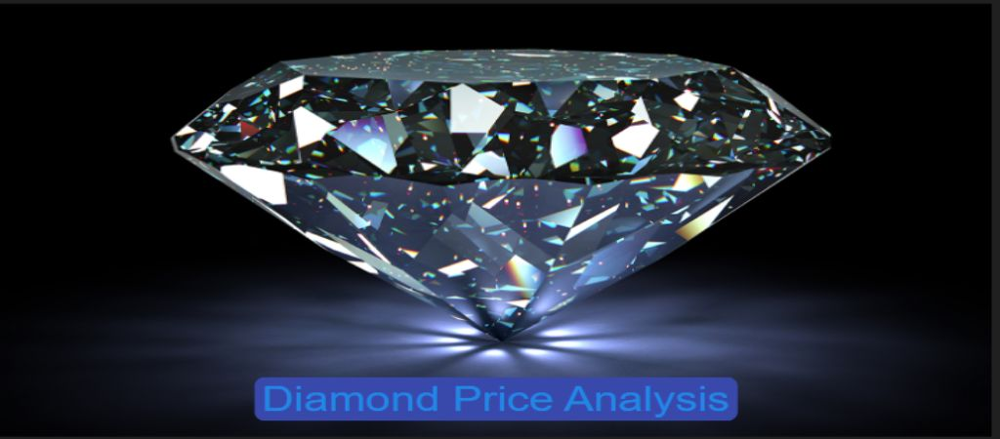

### Load & Understand Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
plt.style.use('ggplot')
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('D:\PGP IN DATA SCIENCE with Careerera\Data Sets\ML Datasets\\diamonds.csv')
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


#### Drop Column 'Unnamed: 0'

In [3]:
df.drop('Unnamed: 0', axis=1, inplace=True)

In [10]:
print("Shape : {} & Size {} of data".format(df.shape, df.size))

Shape : (53940, 10) & Size 539400 of data


In [11]:
print("Data Types:")
df.dtypes

Data Types:


carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
dtype: object

In [12]:
print("Info() Function")
df.info()

Info() Function
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [13]:
print("Descriptive Statistics :")
df.describe()

Descriptive Statistics :


,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


### Missing values

In [14]:
df.isna().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

No Missing values

### Exploratory Data Analysis

### What are the different Cut Quality?

In [4]:
df.cut.unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

**Here Idea cut means the highest quality of diamond.**

### Top 5 Costly Diamonds?

In [7]:
pd.pivot_table(data=df, index=['carat', 'cut', 'color', 'clarity', 'depth', 'table'],
              values='price', aggfunc=max).sort_values(by='price',ascending=False)[:5]

,,,,,,price
carat,cut,color,clarity,depth,table,
2.29,Premium,I,VS2,60.8,60.0,18823
2.00,Very Good,G,SI1,63.5,56.0,18818
1.51,Ideal,G,IF,61.7,55.0,18806
2.07,Ideal,G,SI2,62.5,55.0,18804
2.00,Very Good,H,SI1,62.8,57.0,18803


**2.29 carat Premium cut diamond is costlier.**

### Top 5 Cheap price diamond?

In [9]:
pd.pivot_table(data=df, index=['carat', 'cut', 'color', 'clarity', 'depth', 'table'],
              values='price', aggfunc=min).sort_values(by='price',ascending=True)[:5]

,,,,,,price
carat,cut,color,clarity,depth,table,
0.23,Ideal,E,SI2,61.5,55.0,326
0.21,Premium,E,SI1,59.8,61.0,326
0.23,Good,E,VS1,56.9,65.0,327
0.29,Premium,I,VS2,62.4,58.0,334
0.31,Good,J,SI2,63.3,58.0,335


**0.23 carat Ideal cut diamond is cheaper.**

### Top 5 Weighted diamonds?

In [15]:
pd.pivot_table(data=df, index=['cut', 'color', 'clarity', 'depth', 'table','price'],
              values='carat', aggfunc=max).sort_values(by='carat',ascending=False)[:5]

carat
cut     color clarity depth table price       
Fair    J     I1      65.5  59.0  18018   5.01
                      65.8  58.0  18531   4.50
        H     I1      64.8  61.0  17329   4.13
Premium I     I1      61.0  61.0  15223   4.01
        J     I1      62.5  62.0  15223   4.01

**Diamond with Fair cut & price of 18018 is have highest weight about 5.01 carat.**

### Create new column "Size" by calculating (length x width x depth) of the diamond

In [39]:
df["size"] = df["x"] * df["y"] * df["z"]
df.head(2)

,carat,cut,color,clarity,depth,table,price,x,y,z,size
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.202030
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.505856


### Unique values in Object columns

In [28]:
columns=['cut', 'color','clarity']
for col in columns:
    print("Column Name :", col)
    print("Unique values in column {} are :\n ".format(col), df[col].unique())
    print()

Column Name : cut
Unique values in column cut are :
  ['Ideal' 'Premium' 'Good' 'Very Good' 'Fair']

Column Name : color
Unique values in column color are :
  ['E' 'I' 'J' 'H' 'F' 'G' 'D']

Column Name : clarity
Unique values in column clarity are :
  ['SI2' 'SI1' 'VS1' 'VS2' 'VVS2' 'VVS1' 'I1' 'IF']



**These are the unique values in all object columns.**

### Relationship between Diamond Price and Diamond Weight in Carat wrt "Cut"

In [35]:
figure = px.scatter(data_frame = df, x="carat",
                    y="price", 
                    color= "cut", trendline="ols",
                    title='Relationship between Diamond Price and Diamond Weight in Carat wrt "Cut"')
figure.show()

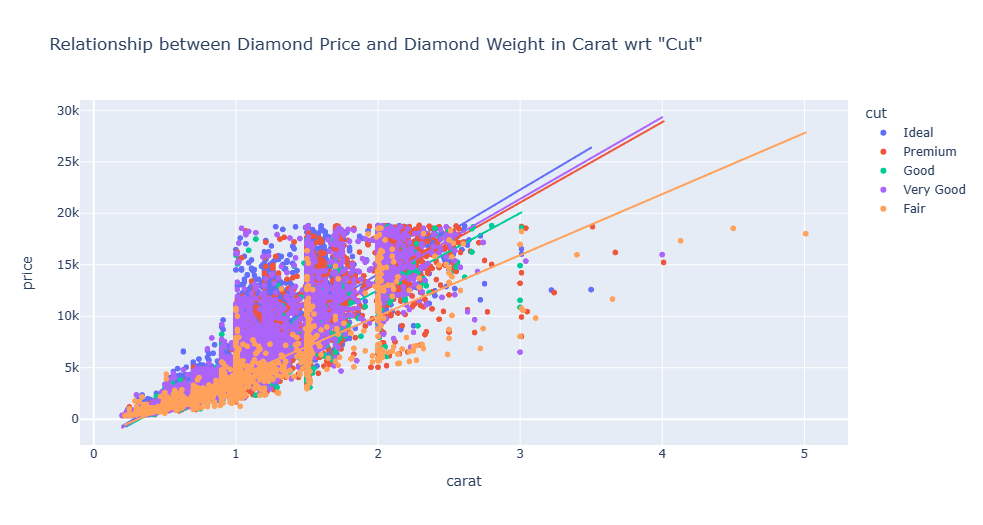

**Trendline for all types of cut have positive slope, that means as the Carat increases the Price of the Diamond increases.**

**Trendline for Idea Cut is having maximum slope, means Idea Cut Diamond have Highest price wrt to Carat.**

### Relationship between Diamond Price and Diamond Weight in Carat wrt "Color"

In [37]:
figure = px.scatter(data_frame = df, x="carat",
                    y="price", 
                    color= "color", trendline="ols",
                    title='Relationship between Diamond Price and Diamond Weight in Carat wrt "Color"')
figure.show()

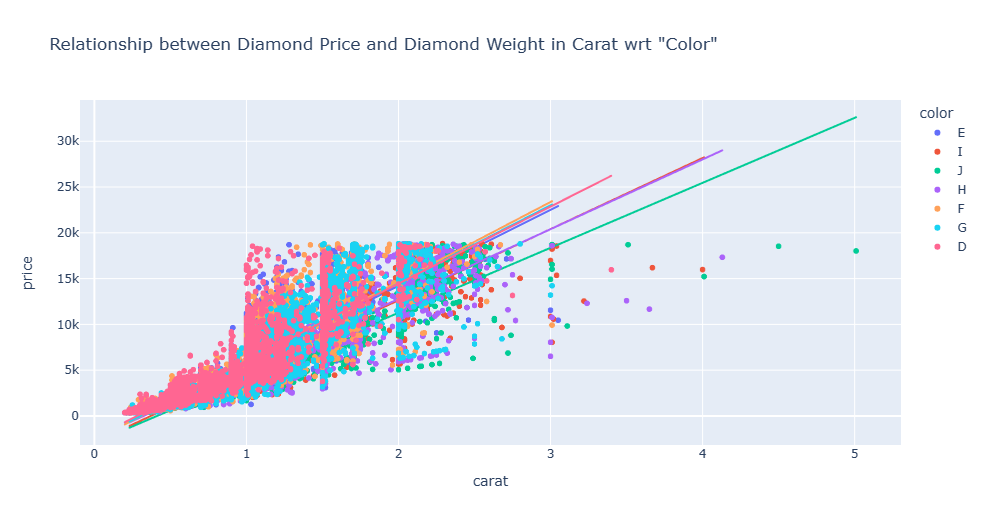

### Relationship between Diamond Price and Diamond Size in Carat wrt "Cut"

In [42]:
figure = px.scatter(data_frame = df, x="size",
                    y="price", 
                    color= "cut", trendline="ols",
                    title='Relationship between Diamond Price and Diamond size in Carat wrt "Cut"')
figure.show()

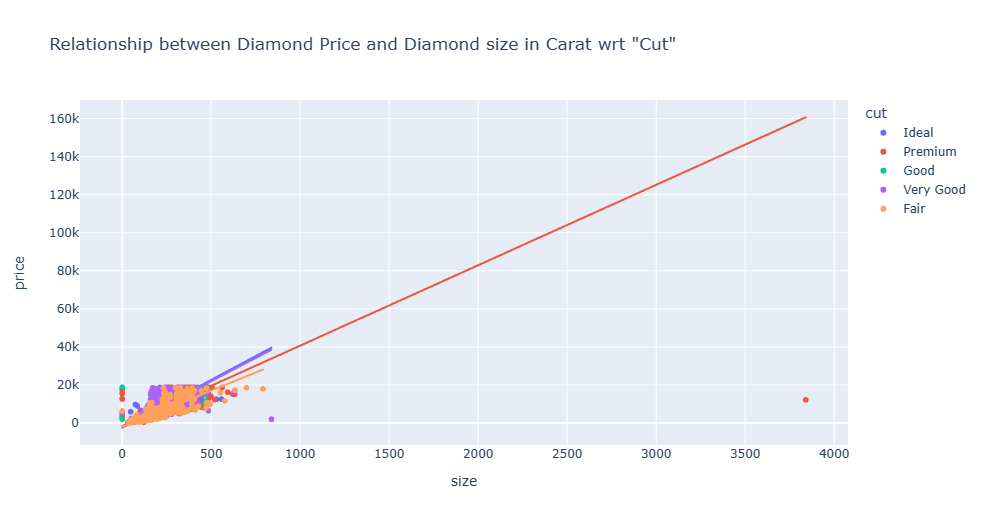

**Premium cut diamonds are relatively large than other diamonds**

**There is a linear relationship between the size of all types of diamonds and their prices**